# Admiral Assignment - By - Anurag Maheshwari
## Problem Statement - To analyse the inpatient data of hyperglycemia and provide various insights based on that.

## Background Information -
#### Hospital management of the hospitalized patient directly affects the morbidity and mortality of any patient suffering from high blood glucose. The given dataset satisfies below criteria:

- It is an inpatient encounter (a hospital admission).<br>
- It is a “diabetic” encounter, that is, one during which any kind of diabetes was entered to the system as a diagnosis.<br>
- The length of stay was at least 1 day and at most 14 days.<br>
- Laboratory tests were performed during the encounter.<br>
- Medicationswere administered during the encounter.

####  Analysis of this dataset can provide insight into what needs to be done in the future to improve patients' health and safety. Inpatient care can be cost-effective and patient outcomes can be improved if blood glucose levels are measured prior to admission. A hospital readmission is when a patient who is discharged from the hospital, gets re-admitted again within a certain period of time. Hospital readmission rates for certain conditions are now considered an indicator of hospital quality, and also affect the cost of care adversely. 
####  Consequently, the primary focus should be on factors that lead to early readmission

## Approach - 
#### 1. Data Quality Issues
#### 2. Exploratory Data Analysis 
#####  &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;a. Univariate analysis
#####  &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;b. Bivariate analysis
#####  &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;c. Multiivariate analysis
#### 3. Future applications of the dataset

In [1]:
## Importing all the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set() 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Reading data

In [2]:
url = "https://drive.google.com/file/d/1h9xSHIAfKVszx65cSkoTI1B4h3LfdVvp/view?usp=sharing"
url='https://drive.google.com/uc?id=' + url.split('/')[-2]
df = pd.read_csv(url)

In [3]:
print(df.shape)
df.head(5)

(101766, 50)


,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,101766.0,1.652016e+08,1.026403e+08,12522.0,84961194.0,152388987.0,2.302709e+08,443867222.0
patient_nbr,101766.0,5.433040e+07,3.869636e+07,135.0,23413221.0,45505143.0,8.754595e+07,189502619.0
admission_type_id,101766.0,2.024006e+00,1.445403e+00,1.0,1.0,1.0,3.000000e+00,8.0
discharge_disposition_id,101766.0,3.715642e+00,5.280166e+00,1.0,1.0,1.0,4.000000e+00,28.0
admission_source_id,101766.0,5.754437e+00,4.064081e+00,1.0,1.0,7.0,7.000000e+00,25.0
time_in_hospital,101766.0,4.395987e+00,2.985108e+00,1.0,2.0,4.0,6.000000e+00,14.0
num_lab_procedures,101766.0,4.309564e+01,1.967436e+01,1.0,31.0,44.0,5.700000e+01,132.0
num_procedures,101766.0,1.339730e+00,1.705807e+00,0.0,0.0,1.0,2.000000e+00,6.0
num_medications,101766.0,1.602184e+01,8.127566e+00,1.0,10.0,15.0,2.000000e+01,81.0
number_outpatient,101766.0,3.693572e-01,1.267265e+00,0.0,0.0,0.0,0.000000e+00,42.0


## 1. Data Quality Issues

#### Lot of "?" sign can be seen which represent NA values. Therefore, replacing that with NaN

In [5]:
df = df.replace("?",np.nan)
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,NaN,NaN,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


#### Check for any duplicate rows

In [6]:
len(df)-len(df.drop_duplicates())

0

#### Check no. of missing values in each column and how prevalent missing values are

In [7]:
df.isnull().sum() 

encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide 

#### Highest missing values are in weight, payer_code and medical_specialty
  - weight ~97% 
  - payer_code ~40%
  - medical_specialty 50%

#### Analysing the unique values in Categorical values

In [8]:
cat_var = ["race", "gender", "age","max_glu_serum","A1Cresult","metformin","repaglinide","nateglinide","chlorpropamide","glimepiride","acetohexamide","glipizide","glyburide","tolbutamide","pioglitazone","rosiglitazone","acarbose","miglitol","troglitazone","tolazamide","examide","citoglipton","insulin","glyburide-metformin","glipizide-metformin","glimepiride-pioglitazone","metformin-rosiglitazone","metformin-pioglitazone","change","diabetesMed","readmitted"]
df_ = df[cat_var].select_dtypes(exclude=['int', 'float'])
for col in df_.columns:
    print(df_[col].unique()) 
    print(df_[col].value_counts())

['Caucasian' 'AfricanAmerican' nan 'Other' 'Asian' 'Hispanic']
Caucasian          76099
AfricanAmerican    19210
Hispanic            2037
Other               1506
Asian                641
Name: race, dtype: int64
['Female' 'Male' 'Unknown/Invalid']
Female             54708
Male               47055
Unknown/Invalid        3
Name: gender, dtype: int64
['[0-10)' '[10-20)' '[20-30)' '[30-40)' '[40-50)' '[50-60)' '[60-70)'
 '[70-80)' '[80-90)' '[90-100)']
[70-80)     26068
[60-70)     22483
[50-60)     17256
[80-90)     17197
[40-50)      9685
[30-40)      3775
[90-100)     2793
[20-30)      1657
[10-20)       691
[0-10)        161
Name: age, dtype: int64
['None' '>300' 'Norm' '>200']
None    96420
Norm     2597
>200     1485
>300     1264
Name: max_glu_serum, dtype: int64
['None' '>7' '>8' 'Norm']
None    84748
>8       8216
Norm     4990
>7       3812
Name: A1Cresult, dtype: int64
['No' 'Steady' 'Up' 'Down']
No        81778
Steady    18346
Up         1067
Down        575
Name: metformin, d

- Gender have 3 'Unknown/Invalid' values  
- 'citoglipton', 'examide' have same values throughout the data. Hence can be removed from the data
- Crucial column - readmitted have values in terms of NO, >30 and <30

In [9]:
## Leaving out Gender values if 'Unknown/Invalid'
## Dropping column 'citoglipton', 'examide'
df = df.drop(df.loc[df["gender"]=="Unknown/Invalid"].index, axis=0)
df = df.drop(['citoglipton', 'examide'], axis = 1)

#### Converting bins in numerical age which is mean of the corresponding bucket e.g [70-80) -> 75


In [10]:
df.age = df.age.replace({"[70-80)":75, "[60-70)":65, "[50-60)":55, "[80-90)":85, "[40-50)":45, "[30-40)":35, "[90-100)":95, "[20-30)":25, "[10-20)":15, "[0-10)":5})

#### Similarly bins of weights care converted to numerical value(Approx middle value of the bin)

In [11]:
df["weight"]=df["weight"].replace({"[75-100)":85,"[50-75)":60,"[100-125)":110,"[125-150)":135,"[25-50)":35,"[0-25)":10,"[150-175)":160,"[175-200)":185,">200":205})

#### <b> Admission ID </b>- Integer identifier corresponding to 9 distinct values, for example, emergency, urgent, elective, newborn, and not available
#### - NULL, Not Available and Not Mapped values should be mapped to NaN
#### - Converting 'Urgent' to 'Emergency' because of similar meaning

In [12]:
mapped = {1.0:"Emergency",
          2.0:"Emergency",
          3.0:"Elective",
          4.0:"New Born",
          5.0:np.nan,
          6.0:np.nan,
          7.0:"Trauma Center",
          8.0:np.nan}
df.admission_type_id = df.admission_type_id.replace(mapped)

#### <b> Discharge disposition </b> - Integer identifier corresponding to 29 distinct values, for example, discharged to home, expired, and not available
When we look the graph, we can see too much values. Getting rid of that situation, we applied this rules:
- Any word that includes "home" will be grouped together
- Otherwise, it will be as OTHER
- NaN are 18, 25, 26

In [13]:
mapped_discharge = {1:"Discharged to Home",
                    6:"Discharged to Home",
                    8:"Discharged to Home",
                    13:"Discharged to Home",
                    19:"Discharged to Home",
                    18:np.nan,25:np.nan,26:np.nan,
                    2:"Other",3:"Other",4:"Other",
                    5:"Other",7:"Other",9:"Other",
                    10:"Other",11:"Other",12:"Other",
                    14:"Other",15:"Other",16:"Other",
                    17:"Other",20:"Other",21:"Other",
                    22:"Other",23:"Other",24:"Other",
                    27:"Other",28:"Other",29:"Other",30:"Other"}

df["discharge_disposition_id"] = df["discharge_disposition_id"].replace(mapped_discharge)

#### <b> Admission Source ID </b>-  Identifier representing 21 distinct values, for example, physician referral, emergency room, and hospital transfer
- Similar ones, such as referrals and transfers, will be grouped together
- NAN will replace Null, Not Mapped, and Unknown values

In [14]:
mapped_adm = {1:"Referral",2:"Referral",3:"Referral",
              4:"Other",5:"Other",6:"Other",10:"Other",22:"Other",25:"Other",
              9:"Other",8:"Other",14:"Other",13:"Other",11:"Other",
              15:np.nan,17:np.nan,20:np.nan,21:np.nan,
              7:"Emergency"}
df.admission_source_id = df.admission_source_id.replace(mapped_adm)

#### <b>Medical Specialty</b> - An integer value corresponding to 84 distinct specialties of the admitting physician, such as cardiology, internal medicine, family medicine, and surgeon
- Therefore, regrouping into the top 10 segment to avoid a lot of categories

In [15]:
top_10=['InternalMedicine','Family/GeneralPractice','Cardiology','Surgery-General', "Nephrology","Orthopedics","Radiologist","Pulmonology"]
df.loc[~df['medical_specialty'].isin(top_10),'medical_specialty']='Other'

#### <b>Diag1, Diag2 and Diag3</b> - Diagnose section there are lot of ICD-9 IDs belong to specific category of disease. So we will map each of the code to the catefory
### Reference - https://en.wikipedia.org/wiki/List_of_ICD-9_codes

In [16]:
def map_diagnosis(data, cols):
    for col in cols:
        data.loc[(data[col].str.contains("V")) | (data[col].str.contains("E")), col] = -1
        data[col] = data[col].astype(np.float16)
    for col in cols:
        data["temp_diag"] = np.nan
        data.loc[(data[col]>=390) & (data[col]<=459) | (data[col]==785), "temp_diag"] = "Circulatory"
        data.loc[(data[col]>=460) & (data[col]<=519) | (data[col]==786), "temp_diag"] = "Respiratory"
        data.loc[(data[col]>=520) & (data[col]<=579) | (data[col]==787), "temp_diag"] = "Digestive"
        data.loc[(data[col]>=250) & (data[col]<251), "temp_diag"] = "Diabetes"
        data.loc[(data[col]>=800) & (data[col]<=999), "temp_diag"] = "Injury"
        data.loc[(data[col]>=710) & (data[col]<=739), "temp_diag"] = "Muscoloskeletal"
        data.loc[(data[col]>=580) & (data[col]<=629) | (data[col] == 788), "temp_diag"] = "Genitourinary"
        data.loc[(data[col]>=140) & (data[col]<=239), "temp_diag"] = "Neoplasms"
        data["temp_diag"] = data["temp_diag"].fillna("Other")
        data[col] = data["temp_diag"]
        data = data.drop("temp_diag", axis=1)
    return data
df = map_diagnosis(df,["diag_1","diag_2","diag_3"])

#### <b>max_glu_serum</b> - Glucose Serum Test Result 
#### <b>A1Cresult</b> - A1c test result 
- Indicates the range of the result or if the test was not taken.
- Converting the categories to numerical values of 0, 1 and 2 using mapping below

In [17]:
df["max_glu_serum"] = df["max_glu_serum"].replace({">200":2, ">300":2, "Norm":1,  "None":0}) 
df["A1Cresult"] = df["A1Cresult"].replace({">7":2, ">8":2, "Norm":1, "None":0})

## 2.a Exploratory Data Analysis - Univariate Analysis

#### <b>Readmitted</b> - Given 3 labels, we can reduce it to 2 categories as Readmitted or not-readmitted
#### Here, we convert 'NO' -> 0 and '>30'/'<30' -> 1

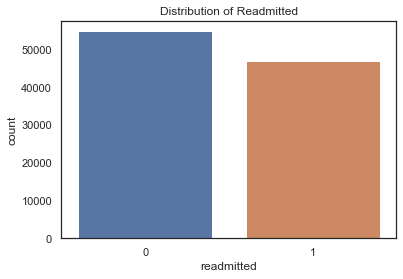

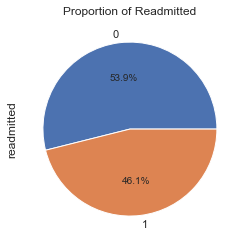

In [18]:
with sns.axes_style("white"):
    df = df.replace({"NO":0,"<30":1,">30":1})
    sns.countplot(x = "readmitted", data = df)
    plt.title("Distribution of Readmitted")
    plt.show()
    df.readmitted.value_counts().plot.pie(autopct = "%.1f%%")
    plt.title("Proportion of Readmitted")
    plt.show()

- Both graph shows that the distribution is almost balanced

#### <b>Race</b> - Caucasian, AfricanAmerican, Hispanic, Asian and Other

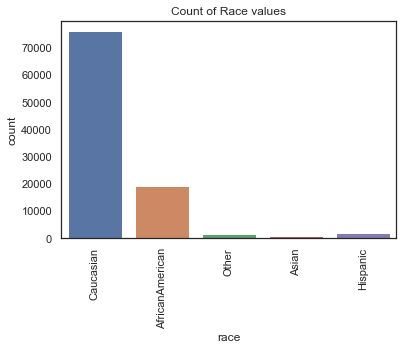

Proportion of Race
Caucasian          76.487557
AfricanAmerican    19.308085
Hispanic            2.047401
Other               1.512684
Asian               0.644273
Name: race, dtype: float64


In [19]:
with sns.axes_style("white"):
    sns.countplot(x=df.race, data = df)
    plt.xticks(rotation=90)
    plt.title("Count of Race values")
    plt.show()
    print("Proportion of Race")
    print(df.race.value_counts(normalize = True)*100)

- As we can see, 76 percent of all our data belongs to Caucasians. The other 24 percent is composed of African Americans, Hispanics, Asians, and Others.
Here we divided into 3 groups: Caucasian, African American, and Other.

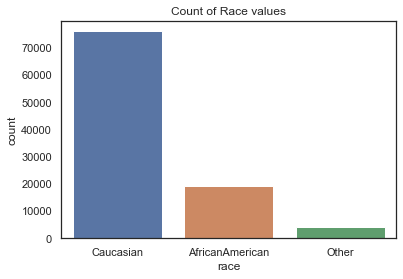

New roportion of Race
Caucasian          76.487557
AfricanAmerican    19.308085
Other               4.204358
Name: race, dtype: float64


In [20]:
with sns.axes_style("white"):
    mapped_race = {"Asian":"Other","Hispanic":"Other"}
    df.race = df.race.replace(mapped_race)
    sns.countplot(x="race", data = df)
    plt.title("Count of Race values")
    plt.show()
    print("New roportion of Race")
    print(df.race.value_counts(normalize= True)*100)

#### <b> Age </b> 

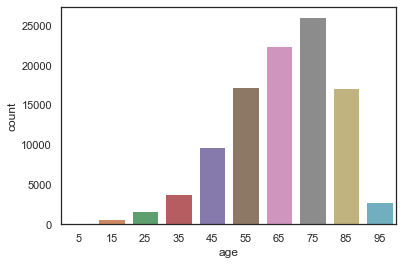

In [21]:
with sns.axes_style("white"):
    sns.countplot(x="age", data = df)
    plt.show()

- Age seems to be skewed left

##### <b> Weight </b> - Although there are very less values present for weight but still the remaining rows we can have some idea of the top proportion of the weight range

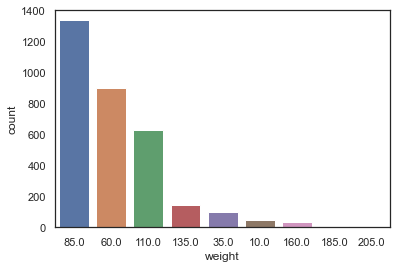

Proportions of Weights
85.0     41.789177
60.0     28.057554
110.0    19.549578
135.0     4.535502
35.0      3.034094
10.0      1.501408
160.0     1.094776
185.0     0.344073
205.0     0.093838
Name: weight, dtype: float64


In [22]:
with sns.axes_style("white"):
    sns.countplot(x = "weight", data = df,order = df.weight.value_counts().index)
    plt.show()
    print("Proportions of Weights")
    print(df.weight.value_counts(normalize=True)*100)

#### <b> Admission ID distribution </b>

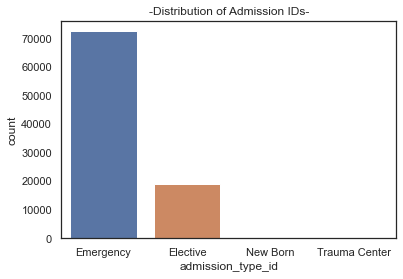

Distribution of Admission ID
Emergency        72468
Elective         18868
Trauma Center       21
New Born            10
Name: admission_type_id, dtype: int64


In [23]:
with sns.axes_style("white"):
    sns.countplot(x = "admission_type_id", data = df)
    plt.title("-Distribution of Admission IDs-")
    plt.show()
    print("Distribution of Admission ID")
    print(df.admission_type_id.value_counts())

#### <b> Discharge Disposition ID Distribution </b>

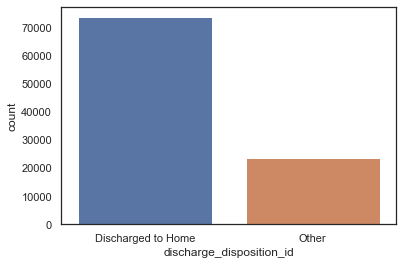

In [24]:
with sns.axes_style("white"):
    sns.countplot(x ="discharge_disposition_id", data = df)
    plt.show()

#### <b> Admission Source ID distribution </b>

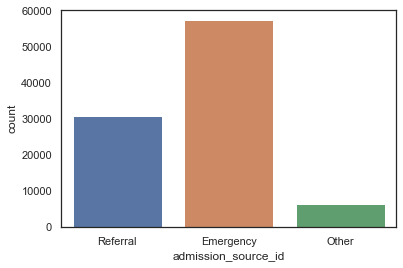

In [25]:
with sns.axes_style("white"):
    sns.countplot(x = "admission_source_id", data = df)
    plt.show()

#### <b> Time </b> - The number of days between admission and discharge. Also known as "treatment time."

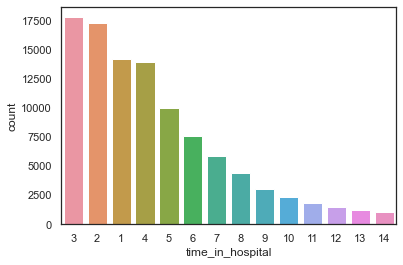

3     17756
2     17224
1     14206
4     13924
5      9966
6      7539
7      5859
8      4390
9      3002
10     2342
11     1855
12     1448
13     1210
14     1042
Name: time_in_hospital, dtype: int64


In [26]:
with sns.axes_style("white"):
    sns.countplot(x="time_in_hospital", data = df, order = df.time_in_hospital.value_counts().index)
    plt.show()
    print(df.time_in_hospital.value_counts())

- The majority of people were hospitalized between two and three days

#### <b>Payer Code </b>- Integer identifier corresponding to 23 distinct values, for example, Blue Cross\Blue Shield, Medicare, and self-pay

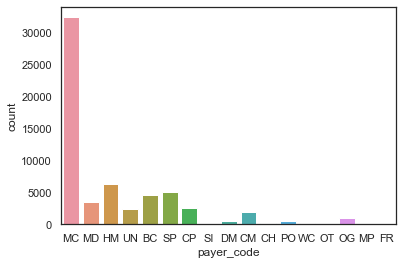

MC    32439
HM     6274
SP     5007
BC     4655
MD     3532
CP     2531
UN     2448
CM     1937
OG     1033
PO      592
DM      549
CH      146
WC      135
OT       95
MP       79
SI       55
FR        1
Name: payer_code, dtype: int64


In [27]:
with sns.axes_style("white"):
    sns.countplot(x = "payer_code", data = df)
    plt.show()
    print(df.payer_code.value_counts())

#### <b> Medical Speciality </b>

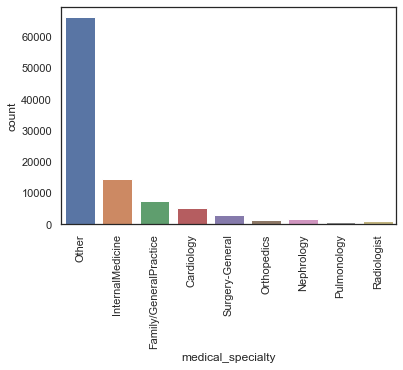

In [28]:
with sns.axes_style("white"):
    sns.countplot(x = "medical_specialty", data = df)
    plt.xticks(rotation = 90)
    plt.show()

#### <b> Number of Lab Procedures </b>- Number of lab tests performed during the encounter

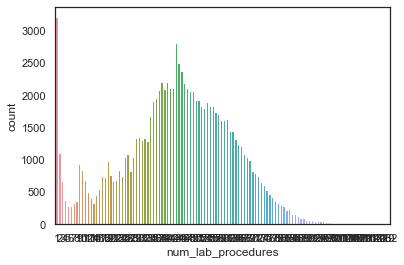

Proportions of Column
1     3208
43    2804
44    2496
45    2376
38    2212
40    2201
46    2189
41    2117
42    2113
47    2106
Name: num_lab_procedures, dtype: int64


In [29]:
with sns.axes_style("white"):
    sns.countplot(x = "num_lab_procedures", data = df)
    plt.show()
    print("Proportions of Column")
    print(df.num_lab_procedures.value_counts().head(10))

#### <b>Number of Procedures</b> - Number of procedures (other than lab tests) performed during the encounter

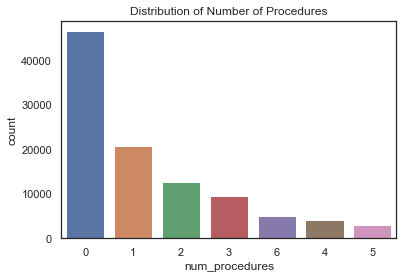

Proportions of Values
0    45.843774
1    20.381671
2    12.495701
3     9.279404
6     4.868174
4     4.107583
5     3.023692
Name: num_procedures, dtype: float64


In [30]:
with sns.axes_style("white"):
    sns.countplot(x = df.num_procedures, order = df.num_procedures.value_counts().index)
    plt.title("Distribution of Number of Procedures")
    plt.show()
    print("Proportions of Values")
    print(df.num_procedures.value_counts(normalize=True)*100)

#### <b>Number of Medications</b> -  Number of distinct generic names administered during the encounter

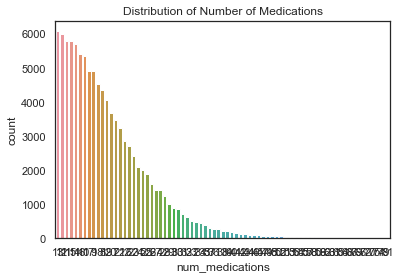

13    6086
12    6004
11    5795
15    5792
14    5707
16    5430
10    5346
17    4919
9     4913
18    4523
8     4353
19    4078
20    3691
7     3484
21    3229
22    2867
6     2698
23    2426
24    2109
5     2017
25    1888
26    1608
27    1432
4     1417
28    1233
29    1000
3      900
30     849
31     712
32     623
33     504
2      470
34     453
35     388
37     293
36     287
1      262
38     228
39     209
40     179
41     146
42     128
43     127
44     100
46      92
45      88
47      74
49      61
48      60
50      55
52      54
51      43
53      40
56      37
54      33
55      32
57      26
58      25
60      23
59      20
62      15
63      14
61      14
65      12
64       8
68       7
67       7
69       5
66       5
72       3
70       2
75       2
74       1
79       1
81       1
Name: num_medications, dtype: int64


In [31]:
with sns.axes_style("white"):
    sns.countplot(x="num_medications", data = df,  order = df.num_medications.value_counts().index)
    plt.title("Distribution of Number of Medications")
    plt.show()
    print(df.num_medications.value_counts())

#### <b> Diag1, Diag2 and Diag3 Distribution </b>

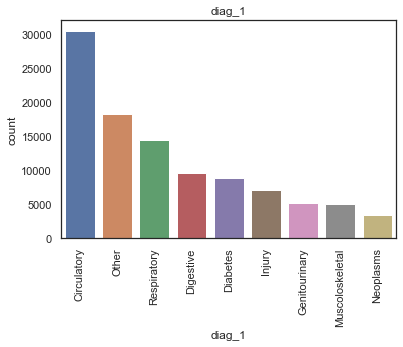

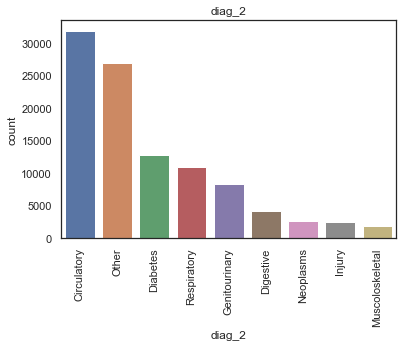

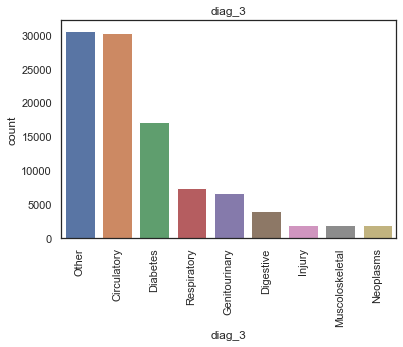

In [32]:
def plot_diags(col,data):
    with sns.axes_style("white"):
        sns.countplot(x = col, data = data,
                order = data[f"{col}"].value_counts().index)
        plt.xticks(rotation = 90)
        plt.title(col)
        plt.show()

diag_cols = ["diag_1","diag_2","diag_3"]

for diag in diag_cols:
    plot_diags(diag,df)

#### <b> Diabetes medications </b>
- 24 features for different medications which indicates whether the drug was prescribed or there was a change in the dosage. Values: “up” if the dosage was increased during the encounter, “down” if the dosage was decreased, “steady” if the dosage did not change, and “no” if the drug was not prescribed


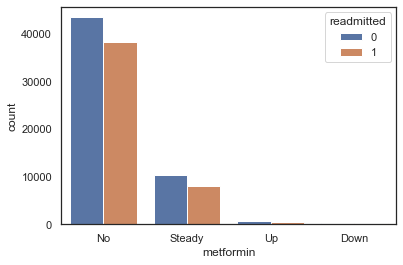

METFORMIN
No        81776
Steady    18345
Up         1067
Down        575
Name: metformin, dtype: int64


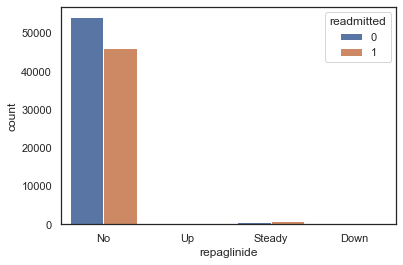

REPAGLINIDE
No        100224
Steady      1384
Up           110
Down          45
Name: repaglinide, dtype: int64


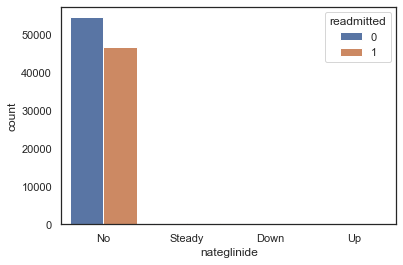

NATEGLINIDE
No        101060
Steady       668
Up            24
Down          11
Name: nateglinide, dtype: int64


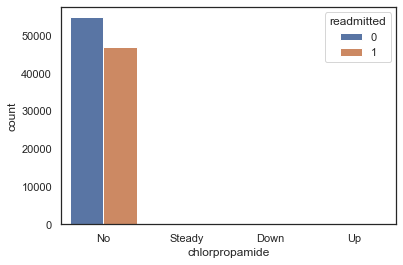

CHLORPROPAMIDE
No        101677
Steady        79
Up             6
Down           1
Name: chlorpropamide, dtype: int64


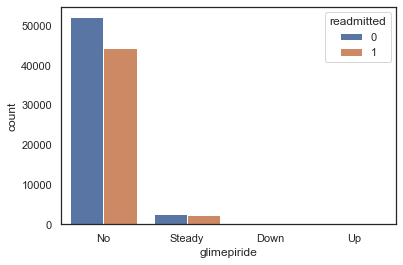

GLIMEPIRIDE
No        96572
Steady     4670
Up          327
Down        194
Name: glimepiride, dtype: int64


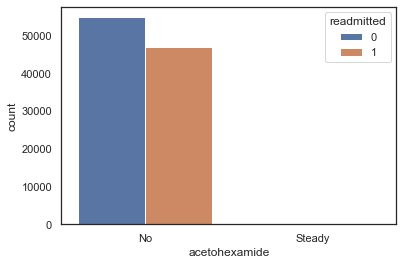

ACETOHEXAMIDE
No        101762
Steady         1
Name: acetohexamide, dtype: int64


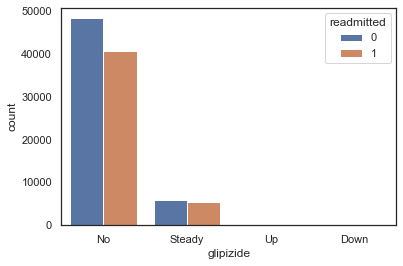

GLIPIZIDE
No        89078
Steady    11355
Up          770
Down        560
Name: glipizide, dtype: int64


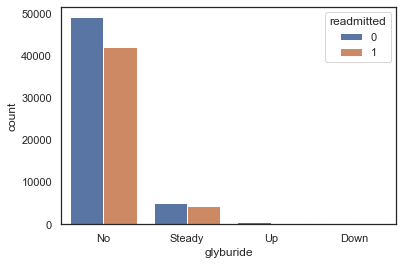

GLYBURIDE
No        91113
Steady     9274
Up          812
Down        564
Name: glyburide, dtype: int64


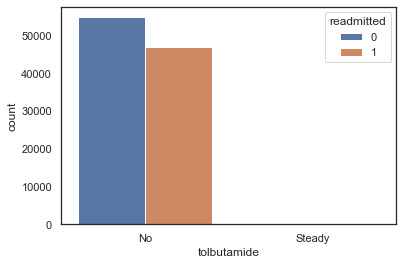

TOLBUTAMIDE
No        101740
Steady        23
Name: tolbutamide, dtype: int64


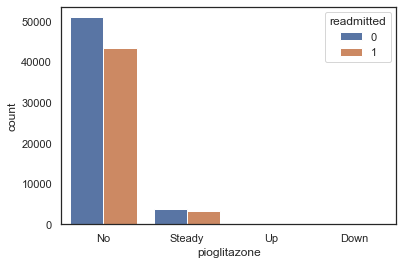

PIOGLITAZONE
No        94436
Steady     6975
Up          234
Down        118
Name: pioglitazone, dtype: int64


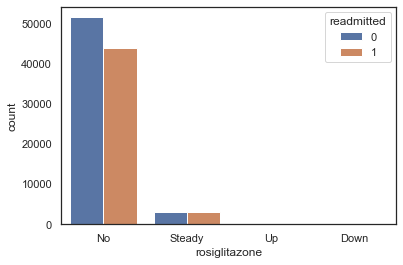

ROSIGLITAZONE
No        95399
Steady     6099
Up          178
Down         87
Name: rosiglitazone, dtype: int64


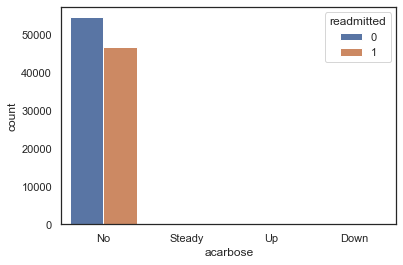

ACARBOSE
No        101455
Steady       295
Up            10
Down           3
Name: acarbose, dtype: int64


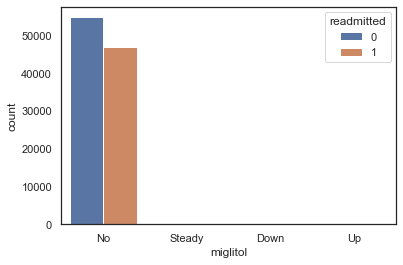

MIGLITOL
No        101725
Steady        31
Down           5
Up             2
Name: miglitol, dtype: int64


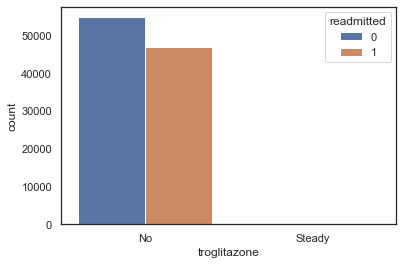

TROGLITAZONE
No        101760
Steady         3
Name: troglitazone, dtype: int64


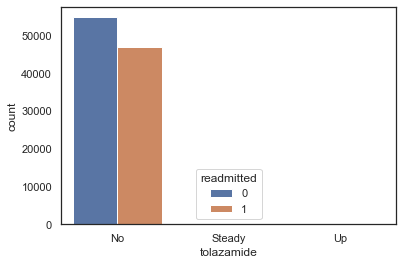

TOLAZAMIDE
No        101724
Steady        38
Up             1
Name: tolazamide, dtype: int64


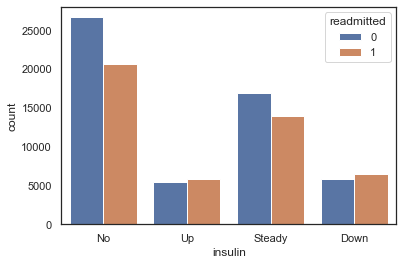

INSULIN
No        47380
Steady    30849
Down      12218
Up        11316
Name: insulin, dtype: int64


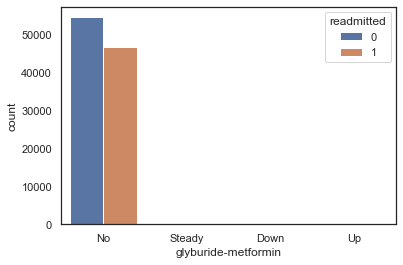

GLYBURIDE-METFORMIN
No        101057
Steady       692
Up             8
Down           6
Name: glyburide-metformin, dtype: int64


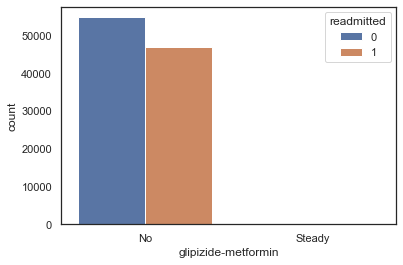

GLIPIZIDE-METFORMIN
No        101750
Steady        13
Name: glipizide-metformin, dtype: int64


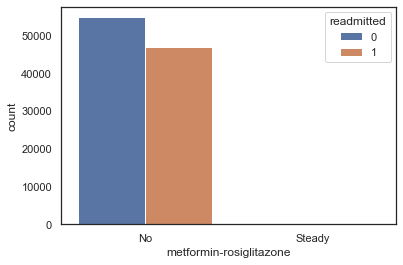

METFORMIN-ROSIGLITAZONE
No        101761
Steady         2
Name: metformin-rosiglitazone, dtype: int64


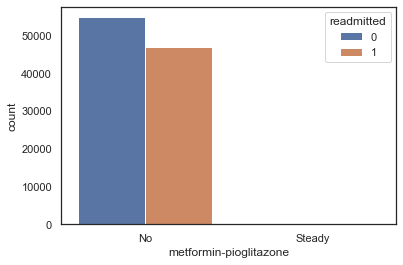

METFORMIN-PIOGLITAZONE
No        101762
Steady         1
Name: metformin-pioglitazone, dtype: int64


In [33]:
drug_cols = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 
             'miglitol', 'troglitazone', 'tolazamide', 'insulin', 'glyburide-metformin', 'glipizide-metformin', 'metformin-rosiglitazone', 'metformin-pioglitazone']
def explore_drug(drugs):
  for drug in drugs:
    with sns.axes_style("white"):
        sns.countplot(x = drug, hue = "readmitted",data = df)
        plt.show()
        print(drug.upper())
        print(df[f"{drug}"].value_counts())
explore_drug(drug_cols)

#### <b>Change</b> Indicates if there was a change in diabetic medications (either dosage or generic name). Values: 'change' or 'no_change'

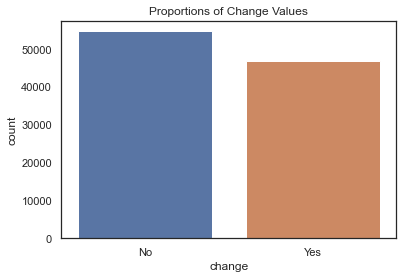

In [34]:
df.change = df.change.replace("Ch","Yes")
with sns.axes_style("white"):
    sns.countplot(x = "change", data = df)
    plt.title("Proportions of Change Values")
    plt.show()

#### <b> Glucose Serum Test Result Distribution</b>

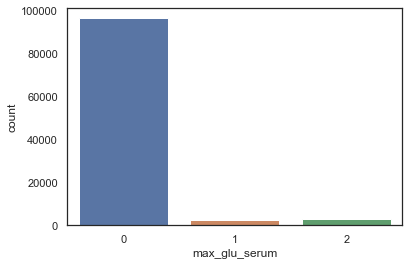

In [35]:
with sns.axes_style("white"):
    sns.countplot(x = "max_glu_serum", data = df)
    plt.show()

#### <b> A1c test result Distribution</b>

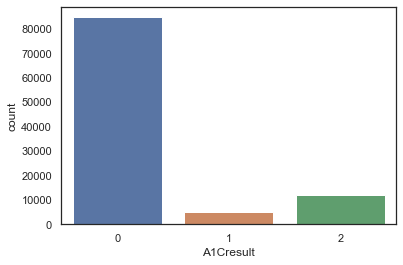

In [36]:
with sns.axes_style("white"):
    sns.countplot(x = "A1Cresult", data = df)
    plt.show()

#### <b> Diabetes medications</b> - Indicates if there was any diabetic medication prescribed. Values: “yes” and “no”

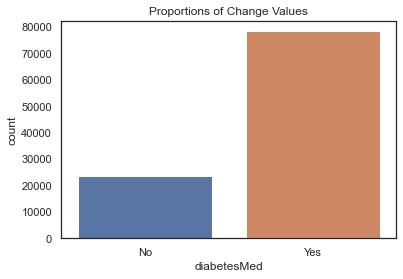

In [37]:
with sns.axes_style("white"):
    sns.countplot(x = "diabetesMed", data = df )
    plt.title("Proportions of Change Values")
    plt.show()

## 2.b Exploratory Data Analysis - Bivariate Analysis
#### Checking each categorical variable distribution against Readmitted Probability

#### <b> Race Vs Readmitted

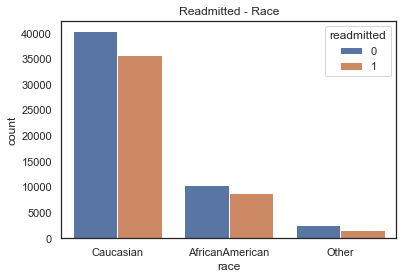

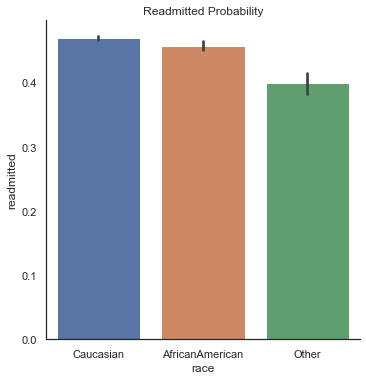

In [38]:
with sns.axes_style("white"):
    sns.countplot(x="race", hue= "readmitted", data = df)
    plt.title("Readmitted - Race")
    plt.show()
    sns.catplot(x = "race", y = "readmitted",data = df, kind = "bar", height= 5)
    plt.title("Readmitted Probability")
    plt.show()

- Despite the fact that Other values are few compared to Caucasian, we see that Readmitted Probability is very close to Caucasian.

#### <b> Gender Vs Readmitted

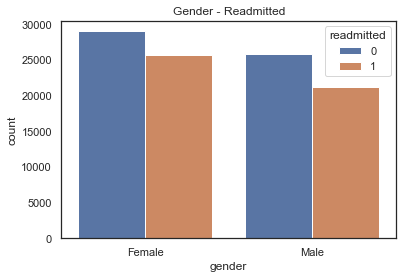

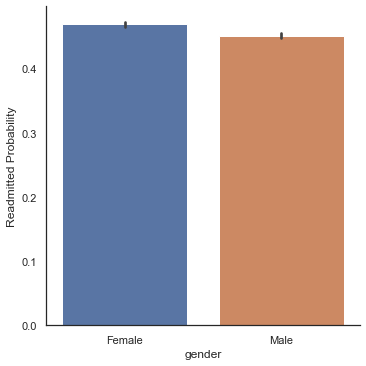

In [39]:
with sns.axes_style("white"):
    sns.countplot(x = "gender", hue = "readmitted", data = df)
    plt.title("Gender - Readmitted")
    plt.show()
    g = sns.catplot(x = "gender",y = "readmitted", data = df, kind = "bar", height= 5)
    g.set_ylabels("Readmitted Probability")
    plt.show()

- Females appear to be slightly more prone to health issues than males, given the nearly equal gender distribution.

#### <b>Age Vs Readmitted 

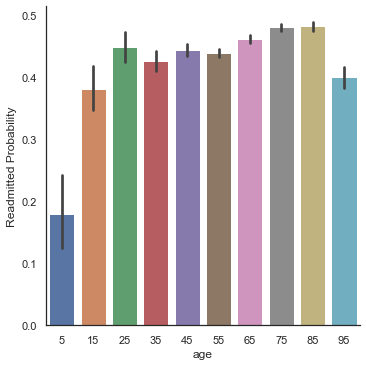

In [40]:
with sns.axes_style("white"):
    g = sns.catplot(x = "age", y = "readmitted", data = df, kind = "bar", height = 5)
    g.set_ylabels("Readmitted Probability")
    plt.show()

- Elderly people are more prone which is understandable

#### <b> Weight Vs Readmitted </b>

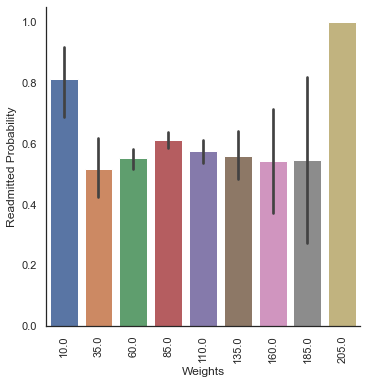

In [41]:
with sns.axes_style("white"):
    g = sns.catplot(x = "weight", y = "readmitted",kind = "bar", data = df, height = 5)
    g.set_xticklabels(rotation = 90)
    g.set_ylabels("Readmitted Probability")
    g.set_xlabels("Weights")
    plt.show()

#### <b> Admission Type Vs Readmitted </b>

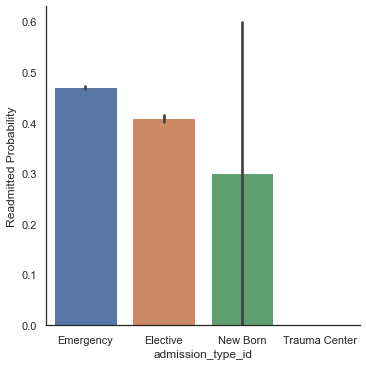

In [42]:
with sns.axes_style("white"):
    g = sns.catplot(x = "admission_type_id", y ="readmitted",  data = df,  kind = "bar")
    g.set_ylabels("Readmitted Probability")
    plt.show()

#### <b> Disposition ID Vs Readmitted </b>

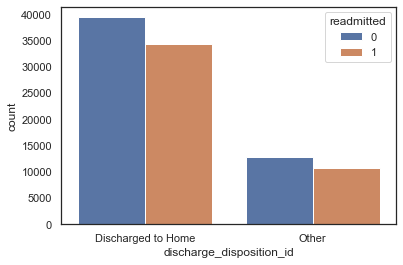

Proportions of ID's
Discharged to Home    73649
Other                 23434
Name: discharge_disposition_id, dtype: int64


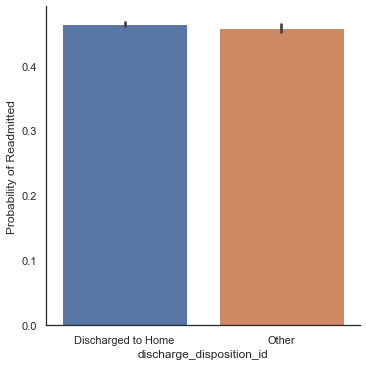

In [43]:
 with sns.axes_style("white"):
    sns.countplot(x ="discharge_disposition_id", hue = "readmitted", data = df)
    plt.show()
    print("Proportions of ID's")
    print(df.discharge_disposition_id.value_counts())
    g = sns.catplot(x = "discharge_disposition_id", y="readmitted", data = df, height = 5, kind ="bar")
    g.set_ylabels("Probability of Readmitted")
    plt.show()

#### <b> Admission Source Vs Readmitted </b>

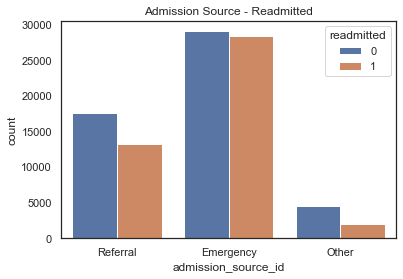

Emergency    57492
Referral     30855
Other         6474
Name: admission_source_id, dtype: int64


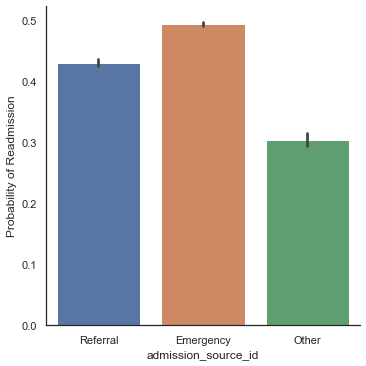

In [44]:
 with sns.axes_style("white"):
    sns.countplot(x = "admission_source_id", hue = "readmitted", data = df)
    plt.title("Admission Source - Readmitted")
    plt.show()
    print(df.admission_source_id.value_counts())
    g = sns.catplot(x = "admission_source_id", y ="readmitted", data = df, kind = "bar", height= 5)
    g.set_ylabels("Probability of Readmission")
    plt.show()

- There is a very close relationship between Readmitted Probability of Referral and Emergency, despite the fact that Emergency has more samples.

#### <b> Payer Code Vs Readmitted </b>

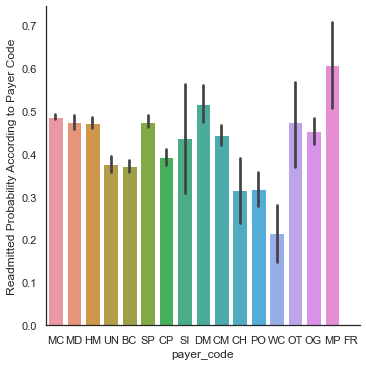

In [45]:
 with sns.axes_style("white"):
    sns.catplot(x = "payer_code", y = "readmitted", data = df, kind = "bar", height = 5)
    plt.ylabel("Readmitted Probability According to Payer Code")
    plt.show()

#### <b> Medical Speciality vs Readmitted </b>

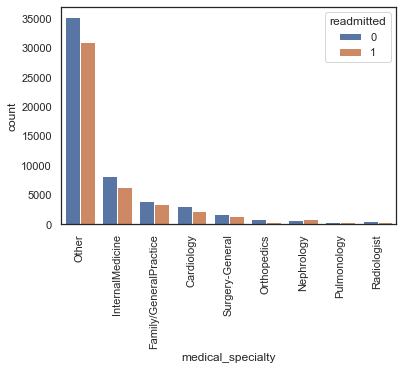

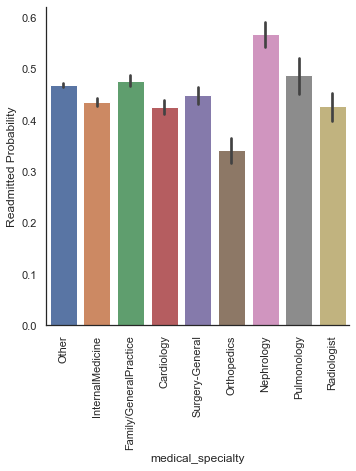

In [46]:
 with sns.axes_style("white"):
    sns.countplot(x = "medical_specialty",hue = "readmitted", data = df)
    plt.xticks(rotation = 90)
    plt.show()
    sns.catplot(x = "medical_specialty", y = "readmitted", data = df, kind = "bar", height = 5)
    plt.ylabel("Readmitted Probability")
    plt.xticks(rotation = 90)
    plt.show()

- Among all sections, nephrology has the highest probability

#### <b> Number of lab procedures Vs Readmitted </b>

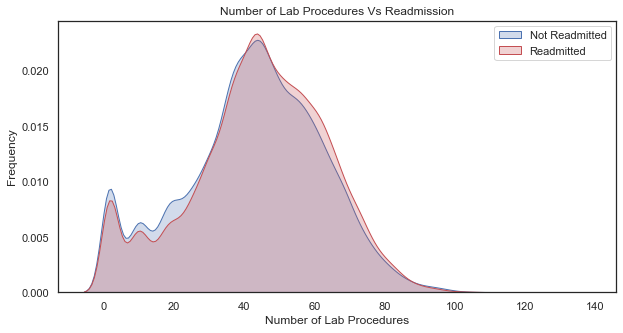

In [47]:
 with sns.axes_style("white"):
    fig = plt.figure(figsize=(10,5))
    ax = sns.kdeplot(df.loc[(df.readmitted == 0), "num_lab_procedures"], color = "b", shade = True,label = "Not Readmitted")
    ax = sns.kdeplot(df.loc[(df.readmitted == 1), "num_lab_procedures"], color = "r", shade = True, label = "Readmitted")
    ax.legend(loc="upper right")
    ax.set_xlabel("Number of Lab Procedures")
    ax.set_ylabel("Frequency")
    ax.set_title("Number of Lab Procedures Vs Readmission")
    plt.show()

#### <b> Number of procedures Vs Readmitted </b>

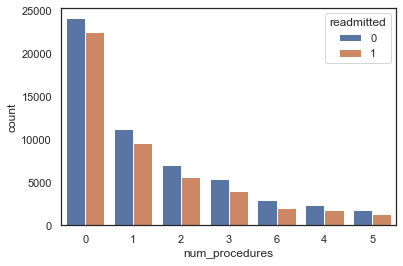

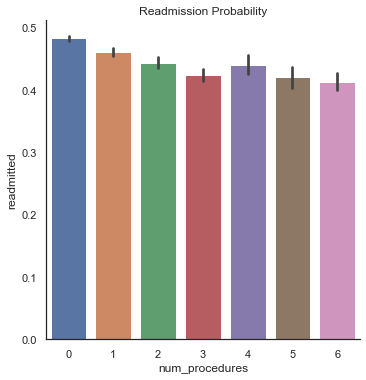

In [48]:
with sns.axes_style("white"):
    sns.countplot(x = "num_procedures", hue = "readmitted",  data = df, order = df.num_procedures.value_counts().index)
    plt.show()
    sns.catplot(x = "num_procedures", y = "readmitted", data = df, kind = "bar", height = 5)
    plt.title("Readmission Probability")
    plt.show()

#### <b>Change Vs Readmitted</b>

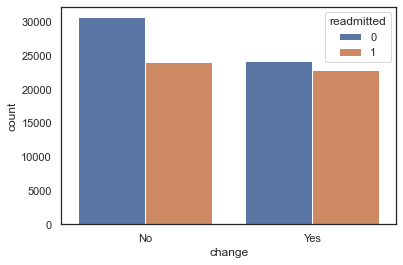

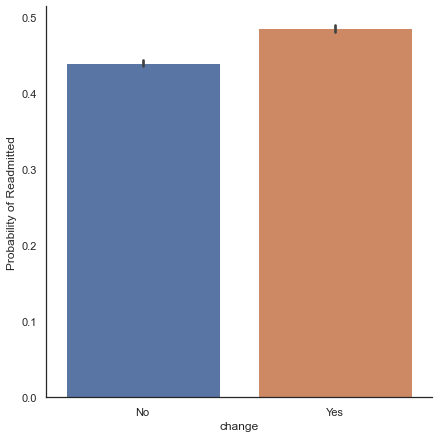

In [49]:
with sns.axes_style("white"):
    sns.countplot(x = "change", hue = "readmitted", data = df)
    plt.show()
    g = sns.catplot(x = "change", y="readmitted", data = df, height = 6, kind ="bar")
    g.set_ylabels("Probability of Readmitted")
    plt.show()

#### <b> Glucose Serum Test Vs Readmitted </b>

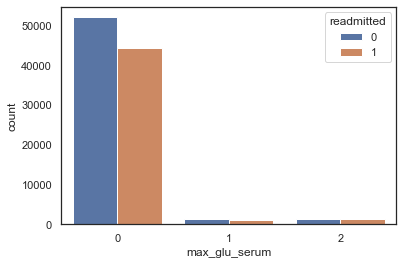

0    96417
2     2749
1     2597
Name: max_glu_serum, dtype: int64


In [50]:
with sns.axes_style("white"):
    sns.countplot(x = "max_glu_serum",hue = "readmitted", data = df)
    plt.show()
    print(df.max_glu_serum.value_counts())

#### <b> A1c test result Vs Readmitted </b>

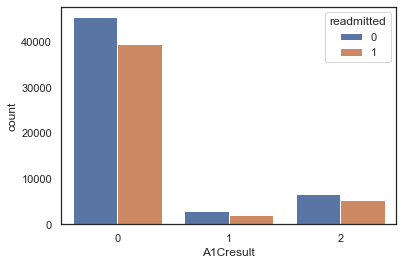

0    84745
2    12028
1     4990
Name: A1Cresult, dtype: int64


In [51]:
with sns.axes_style("white"):
    sns.countplot(x = "A1Cresult",hue = "readmitted", data = df)
    plt.show()
    print(df.A1Cresult.value_counts())

#### <b> Diabetes medications Vs Readmitted </b>

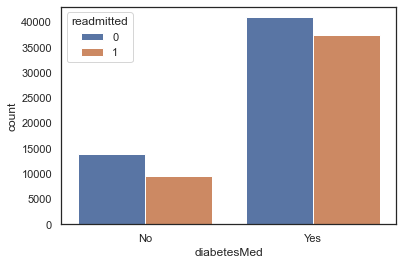

Yes    78361
No     23402
Name: diabetesMed, dtype: int64


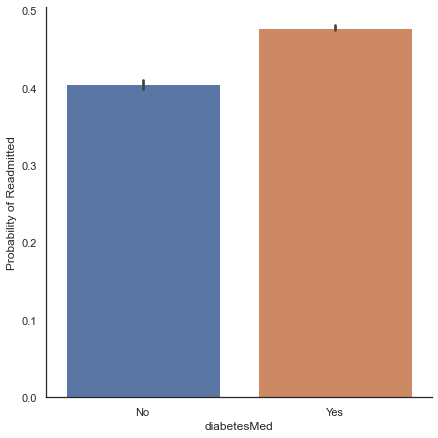

In [52]:
with sns.axes_style("white"):
    sns.countplot(x = "diabetesMed", hue = "readmitted", data = df)
    plt.show()
    print(df.diabetesMed.value_counts())
    g = sns.catplot(x = "diabetesMed", y="readmitted", data = df, height = 6, kind ="bar")
    g.set_ylabels("Probability of Readmitted")
    plt.show()

In [53]:
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,5,NaN,NaN,NaN,Referral,1,NaN,Other,41,0,1,0,0,0,Diabetes,Other,Other,1,0,0,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0
1,149190,55629189,Caucasian,Female,15,NaN,Emergency,Discharged to Home,Emergency,3,NaN,Other,59,0,18,0,0,0,Other,Diabetes,Other,9,0,0,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Yes,Yes,1
2,64410,86047875,AfricanAmerican,Female,25,NaN,Emergency,Discharged to Home,Emergency,2,NaN,Other,11,5,13,2,0,1,Other,Diabetes,Other,6,0,0,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,0
3,500364,82442376,Caucasian,Male,35,NaN,Emergency,Discharged to Home,Emergency,2,NaN,Other,44,1,16,0,0,0,Other,Diabetes,Circulatory,7,0,0,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Yes,Yes,0
4,16680,42519267,Caucasian,Male,45,NaN,Emergency,Discharged to Home,Emergency,1,NaN,Other,51,0,8,0,0,0,Neoplasms,Neoplasms,Diabetes,5,0,0,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Yes,Yes,0


## 2.c Exploraory Data Analysis -Multivariate Analysis using Profile Modeling Technique

In [55]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- We can see that the overall correlation betweeen the variable is quite low, with some exception, especially with the glucose serum and weight, and between the number of medications and the time in the hospital.

## 3. Future application of the dataset
- Reducing hospital costs can be done by predicting readmission and identifying top variables - this can be done with Random Forest Regression, SVM/logistic regression, and adding feature importance to that.
- Most effective drug can also be identified for the cure of High Blood Glucose using feature importance of various classification technique.
- Using Treatment as the target variable we can ideentify most effective ways of treatment.